In [1]:
import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from joblib import Parallel, delayed
import multiprocessing
import ipywidgets as widgets
from moviepy.editor import VideoClip
from moviepy.video.io.bindings import mplfig_to_npimage
from moviepy.video.fx.all import crop

%matplotlib inline

### Single rotating cube

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


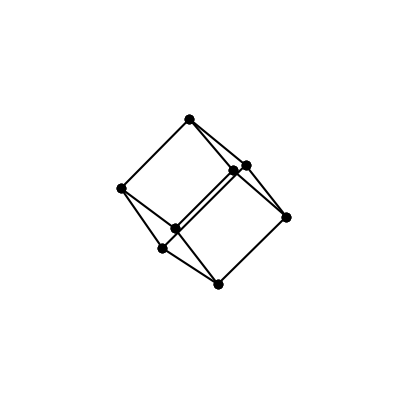

In [ ]:
A = [0,0,0]
B = [0,0,1]
C = [0,1,0]
D = [1,0,0]
E = [0,1,1]
F = [1,1,0]
G = [1,0,1]
H = [1,1,1]

S = np.array([[A,B],[A,C],[A,D],[B,E],[B,G],[C,E],[C,F],[D,F],[D,G],[E,H],[F,H],[G,H]])-0.5*np.array(H)
# S.shape

# perspective projection function
def perspective_proj(point, d=3.0):
    x, y, z = point
    return np.array([d * x / (d - z), d * y / (d - z)])


fig, axs = plt.subplots(1, 1, figsize=(5,5))
axs.set_xlim([-2,2])
axs.axis('equal')

def plt_anim_proj(t):
    t1 = 2 * np.pi / 8
    R1 = np.array([
        [np.cos(t1), -np.sin(t1), 0],
        [np.sin(t1),  np.cos(t1), 0],
        [0, 0, 1]
    ])
    t2 = 2 * np.pi / 8
    R2 = np.array([
        [np.cos(t2), 0, -np.sin(t2)],
        [0, 1, 0],
        [np.sin(t2), 0,  np.cos(t2)]
    ])
    t3 = 2 * np.pi / 8 * t
    R3 = np.array([
        [1, 0, 0],
        [0, np.cos(t3), -np.sin(t3)],
        [0, np.sin(t3),  np.cos(t3)]
    ])

    axs.clear()
    axs.axis('equal')
    axs.set_xlim([-2, 2])
    axs.set_ylim([-2, 2])
    plt.axis('off')

    d = 4.0
    
    Srot = [S[i] @ R1 @ R2 @ R3 for i in range(12)]
    
    for p in Srot:
        p0 = perspective_proj(p[0], d)
        p1 = perspective_proj(p[1], d)
        plt.plot([p0[0], p1[0]], [p0[1], p1[1]], '-o', color='black')

    return mplfig_to_npimage(fig)

duration = 10
fps = 15
name = 'cube_3d'

animation = VideoClip(lambda t: plt_anim_proj(t), duration=duration)
animation.ipython_display(fps=fps, loop=True, autoplay=True)
# animation.write_videofile(name, fps=fps)

### Special viewpint single tesseract rotating around special axis z-w plane (4D -> 3D -> 2D)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


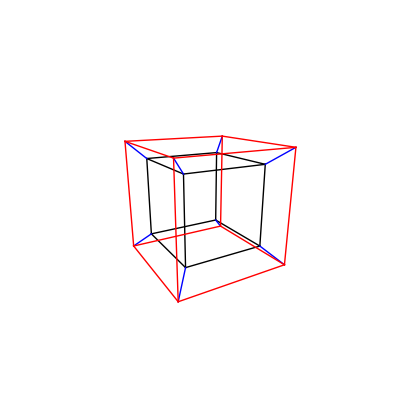

In [ ]:
A = [0,0,0,0]
B = [0,0,0,1]
C = [0,0,1,0]
D = [0,1,0,0]
E = [1,0,0,0]
F = [0,0,1,1]
G = [0,1,0,1]
H = [1,0,0,1]
I = [0,1,1,0]
J = [1,0,1,0]
K = [1,1,0,0]
L = [0,1,1,1]
M = [1,0,1,1]
N = [1,1,0,1]
O = [1,1,1,0]
P = [1,1,1,1]

S = np.array([
    [A,B],[A,D],
    [B,G],[D,G],
    [D,K],[E,K],
    [E,H],[B,H],
    [A,E],[G,N],
    [H,N],[K,N],
    #
    [A,C],[B,F],
    [D,I],[G,L],
    [E,J],[H,M],
    [N,P],[K,O],
    #
    [F,L],[F,M],
    [I,L],[I,O],
    [J,M],[J,O],
    [L,P],
    [M,P],
    [O,P],
    [C,I],
    [C,J],[C,F]
])-0.5 * np.array(P)


# projection functions (4D -> 3D -> 2D)
def perspective_proj_4d_to_3d(v, d=7.0):
    w = v[3]
    factor = d / (d - w)
    return v[:3] * factor

def perspective_proj_3d_to_2d(v, d=5.0):
    z = v[2]
    factor = d / (d - z)
    return v[:2] * factor


# rotation functions
def rotation_matrix_4d(i, j, theta):
    R = np.eye(4)
    c, s = np.cos(theta), np.sin(theta)
    R[[i,i,j,j],[i,j,i,j]] = [c,-s,s,c]
    return R

def rotation_matrix_3d_y(theta):
    c, s = np.cos(theta), np.sin(theta)
    return np.array([
        [ c, 0,  s],
        [ 0, 1,  0],
        [-s, 0,  c]
    ])

def rotation_matrix_3d_x(theta):
    c, s = np.cos(theta), np.sin(theta)
    return np.array([
        [1, 0,  0],
        [ 0,c, s],
        [ 0,-s, c]  
    ])


# plotting
fig, ax = plt.subplots(figsize=(5, 5))

def tesseract_anim(t):
    ax.clear()
    ax.set_xlim([-2, 2])
    ax.set_ylim([-2, 2])
    plt.axis('off')
    
    # 4D rotation
    th = 2 * np.pi * t / 8
    R = rotation_matrix_4d(2, 3, th) # rotating around z-w plane
    
    Srot = S @ R.T
    Srot_proj = []
    
    for seg in Srot:
        # 4d to 3d
        p0_3d = perspective_proj_4d_to_3d(seg[0], d=3)
        p1_3d = perspective_proj_4d_to_3d(seg[1], d=3)
        
        # special viewpoint - look like regular tesseract shape
        theta3d_y = np.pi / 6
        R3d_y = rotation_matrix_3d_y(theta3d_y)
        theta3d_x = -np.pi / 10
        R3d_x = rotation_matrix_3d_x(theta3d_x)
        p0_3d = p0_3d @ R3d_y.T @ R3d_x.T
        p1_3d = p1_3d @ R3d_y.T @ R3d_x.T
        
        # 3d to 2d
        p0_2d = perspective_proj_3d_to_2d(p0_3d, d=3)
        p1_2d = perspective_proj_3d_to_2d(p1_3d, d=3)
        Srot_proj.append([p0_2d, p1_2d])
    
    for idx, s in enumerate(Srot_proj):
        if idx < 12:
            color = 'black' 
        elif idx<20: 
            color = 'blue' 
        else: 
            color = 'red' # alternating colors (better to understand)
        ax.plot([s[0][0], s[1][0]], [s[0][1], s[1][1]], '-', color = color, linewidth = 1)
    return mplfig_to_npimage(fig)


duration = 10
fps = 30
name = "transparent_tesseract_1.mp4"

animation = VideoClip(lambda t: tesseract_anim(t), duration=duration)
animation.ipython_display(fps=fps, loop=True, autoplay=True)
# animation.write_videofile(name, fps=fps)


### Special viewpint single tesseract rotating around special axis x-z plane (4D -> 3D -> 2D)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


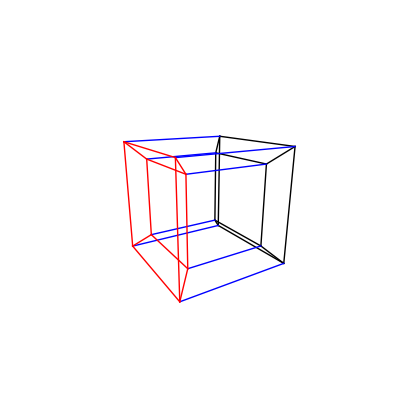

In [6]:
A = [0,0,0,0]
B = [0,0,0,1]
C = [0,0,1,0]
D = [0,1,0,0]
E = [1,0,0,0]
F = [0,0,1,1]
G = [0,1,0,1]
H = [1,0,0,1]
I = [0,1,1,0]
J = [1,0,1,0]
K = [1,1,0,0]
L = [0,1,1,1]
M = [1,0,1,1]
N = [1,1,0,1]
O = [1,1,1,0]
P = [1,1,1,1]

S = np.array([
    [A,B],[A,D],
    [B,G],[D,G],
    [D,K],[E,K],
    [E,H],[B,H],
    [A,E],[G,N],
    [H,N],[K,N],
    #
    [A,C],[B,F],
    [D,I],[G,L],
    [E,J],[H,M],
    [N,P],[K,O],
    #
    [F,L],[F,M],
    [I,L],[I,O],
    [J,M],[J,O],
    [L,P],
    [M,P],
    [O,P],
    [C,I],
    [C,J],[C,F]
])-0.5 * np.array(P)


# projection functions (4D -> 3D -> 2D)
def perspective_proj_4d_to_3d(v, d=7.0):
    w = v[3]
    factor = d / (d - w)
    return v[:3] * factor

def perspective_proj_3d_to_2d(v, d=5.0):
    z = v[2]
    factor = d / (d - z)
    return v[:2] * factor


# rotation functions
def rotation_matrix_4d(i, j, theta):
    R = np.eye(4)
    c, s = np.cos(theta), np.sin(theta)
    R[[i,i,j,j],[i,j,i,j]] = [c,-s,s,c]
    return R

def rotation_matrix_3d_y(theta):
    c, s = np.cos(theta), np.sin(theta)
    return np.array([
        [ c, 0,  s],
        [ 0, 1,  0],
        [-s, 0,  c]
    ])

def rotation_matrix_3d_x(theta):
    c, s = np.cos(theta), np.sin(theta)
    return np.array([
        [1, 0,  0],
        [ 0,c, s],
        [ 0,-s, c]  
    ])


# plotting
fig, ax = plt.subplots(figsize=(5, 5))

def tesseract_anim(t):
    ax.clear()
    ax.set_xlim([-2, 2])
    ax.set_ylim([-2, 2])
    plt.axis('off')
    
    # 4D rotation
    th = 2 * np.pi * t / 8
    R = rotation_matrix_4d(0, 2, th) # rotating around x-z plane
    
    Srot = S @ R.T
    Srot_proj = []
    
    for seg in Srot:
        # 4d to 3d
        p0_3d = perspective_proj_4d_to_3d(seg[0], d=3)
        p1_3d = perspective_proj_4d_to_3d(seg[1], d=3)
        
        # special viewpoint - look like regular tesseract shape
        theta3d_y = np.pi / 6
        R3d_y = rotation_matrix_3d_y(theta3d_y)
        theta3d_x = -np.pi / 10
        R3d_x = rotation_matrix_3d_x(theta3d_x)
        p0_3d = p0_3d @ R3d_y.T @ R3d_x.T
        p1_3d = p1_3d @ R3d_y.T @ R3d_x.T
        
        # 3d to 2d
        p0_2d = perspective_proj_3d_to_2d(p0_3d, d=3)
        p1_2d = perspective_proj_3d_to_2d(p1_3d, d=3)
        Srot_proj.append([p0_2d, p1_2d])
    
    for idx, s in enumerate(Srot_proj):
        if idx < 12:
            color = 'black' 
        elif idx<20: 
            color = 'blue' 
        else: 
            color = 'red' # alternating colors (better to understand)
        ax.plot([s[0][0], s[1][0]], [s[0][1], s[1][1]], '-', color = color, linewidth = 1)
    return mplfig_to_npimage(fig)


duration = 10
fps = 30
name = "transparent_tesseract_1.mp4"

animation = VideoClip(lambda t: tesseract_anim(t), duration=duration)
animation.ipython_display(fps=fps, loop=True, autoplay=True)
# animation.write_videofile(name, fps=fps)


### Nonspecial viewpint single tesseract rotating around nonspecial axis (4D -> 2D)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


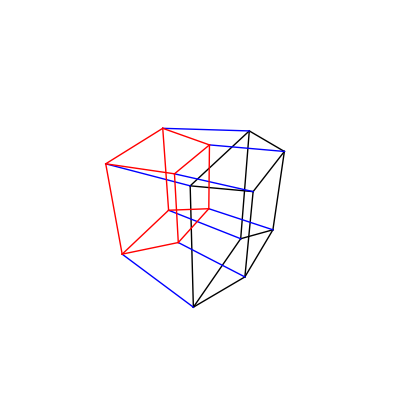

In [ ]:
A = [0,0,0,0]
B = [0,0,0,1]
C = [0,0,1,0]
D = [0,1,0,0]
E = [1,0,0,0]
F = [0,0,1,1]
G = [0,1,0,1]
H = [1,0,0,1]
I = [0,1,1,0]
J = [1,0,1,0]
K = [1,1,0,0]
L = [0,1,1,1]
M = [1,0,1,1]
N = [1,1,0,1]
O = [1,1,1,0]
P = [1,1,1,1]

S = np.array([
    [A,B],[A,D],
    [B,G],[D,G],
    [D,K],[E,K],
    [E,H],[B,H],
    [A,E],[G,N],
    [H,N],[K,N],
    #
    [A,C],[B,F],
    [D,I],[G,L],
    [E,J],[H,M],
    [N,P],[K,O],
    #
    [F,L],[F,M],
    [I,L],[I,O],
    [J,M],[J,O],
    [L,P],
    [M,P],
    [O,P],
    [C,I],
    [C,J],[C,F]
])-0.5 * np.array(P)

# projection function
# This function is similar to the previous functions used for perspective
# Those performed projection in two stages (4D -> 3D -> 2D)
# while this performs the same thing in a single step (4D -> 2D)
#
def perspective_proj_4d_to_2d(v, d=5.0):
    z,w = v[2],v[3]
    factor = d**2 / ((d*d)-(d*w)-(d*z))
    return v[:2] * factor


# rotation function
def rotation_matrix_4d(i, j, theta):
    R = np.eye(4)
    c, s = np.cos(theta), np.sin(theta)
    R[i, i] = c;  R[i, j] = -s
    R[j, i] = s;  R[j, j] =  c
    return R


# plotting
fig, ax = plt.subplots(figsize=(5, 5))

def tesseract_anim(t):
    ax.clear()
    ax.set_xlim([-2, 2])
    ax.set_ylim([-2, 2])
    plt.axis('off')
    
    th = 2 * np.pi * t / 8
    R = rotation_matrix_4d(0, 2, th)
    
    Srot = S @ R.T
    Srot_proj = []
    
    for seg in Srot:
        # nonspecial viewpoint - different from regular shaped tesseract
        theta = np.pi / 6
        r1 = rotation_matrix_4d(0, 1, 0)
        r2 = rotation_matrix_4d(0, 2, theta)
        r3 = rotation_matrix_4d(0, 3, theta)
        r4 = rotation_matrix_4d(1, 2, theta)
        r5 = rotation_matrix_4d(1, 3, 0)
        r6 = rotation_matrix_4d(2, 3, 0)
        
        p0_4d = seg[0]
        p1_4d = seg[1]
        
        p0_4d = p0_4d @ r1.T @ r2.T @ r3.T @ r4.T @ r5.T @ r6.T
        p1_4d = p1_4d @ r1.T @ r2.T @ r3.T @ r4.T @ r5.T @ r6.T
        
        # 4d to 2d
        p0_2d = perspective_proj_4d_to_2d(p0_4d, d=3)
        p1_2d = perspective_proj_4d_to_2d(p1_4d, d=3)
        Srot_proj.append([p0_2d, p1_2d])
        
    for idx, s in enumerate(Srot_proj):
        if idx < 12:
            color = 'black' 
        elif idx<20: 
            color = 'blue' 
        else: 
            color = 'red' # alternating colors (better to understand)
        ax.plot([s[0][0], s[1][0]], [s[0][1], s[1][1]], '-', color = color, linewidth = 1)
    return mplfig_to_npimage(fig)


duration = 10
fps = 30
name = "nonspecial_transparent_tesseract_1.mp4"

animation = VideoClip(lambda t: tesseract_anim(t), duration=duration)
animation.ipython_display(fps=fps, loop=True, autoplay=True)
# animation.write_videofile(name, fps=fps)

### Nonspecial viewpint three tesseracts rotating around nonspecial axis (4D -> 2D)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


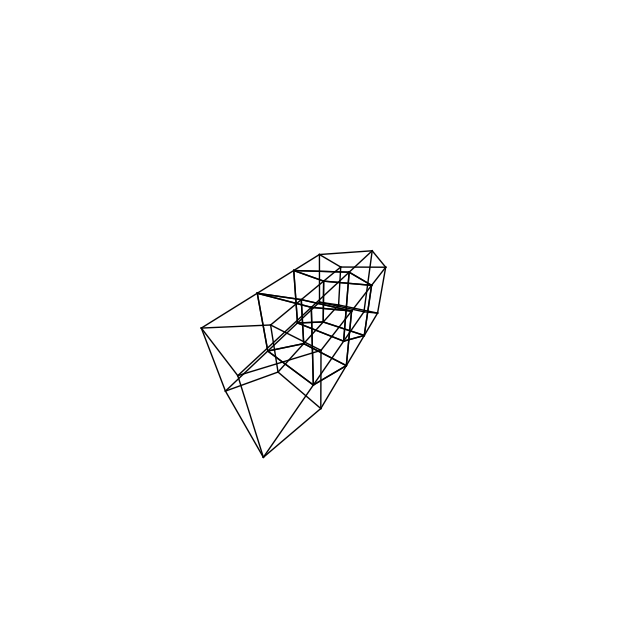

In [ ]:
A = [0,0,0,0]
B = [0,0,0,1]
C = [0,0,1,0]
D = [0,1,0,0]
E = [1,0,0,0]
F = [0,0,1,1]
G = [0,1,0,1]
H = [1,0,0,1]
I = [0,1,1,0]
J = [1,0,1,0]
K = [1,1,0,0]
L = [0,1,1,1]
M = [1,0,1,1]
N = [1,1,0,1]
O = [1,1,1,0]
P = [1,1,1,1]

S1 = np.array([
    [A,B],[A,D],
    [B,G],[D,G],
    [D,K],[E,K],
    [E,H],[B,H],
    [A,E],[G,N],
    [H,N],[K,N],
    #
    [A,C],[B,F],
    [D,I],[G,L],
    [E,J],[H,M],
    [N,P],[K,O],
    #
    [F,L],[F,M],
    [I,L],[I,O],
    [J,M],[J,O],
    [L,P],
    [M,P],
    [O,P],
    [C,I],
    [C,J],[C,F]
])-0.5 * np.array(P)

S2 = np.array([
    [A,B],[A,D],
    [B,G],[D,G],
    [D,K],[E,K],
    [E,H],[B,H],
    [A,E],[G,N],
    [H,N],[K,N],
    #
    [A,C],[B,F],
    [D,I],[G,L],
    [E,J],[H,M],
    [N,P],[K,O],
    #
    [F,L],[F,M],
    [I,L],[I,O],
    [J,M],[J,O],
    [L,P],
    [M,P],
    [O,P],
    [C,I],
    [C,J],[C,F]
])-0.5 * np.array(P) + np.array([1,0,0,0])

S3 = np.array([
    [A,B],[A,D],
    [B,G],[D,G],
    [D,K],[E,K],
    [E,H],[B,H],
    [A,E],[G,N],
    [H,N],[K,N],
    #
    [A,C],[B,F],
    [D,I],[G,L],
    [E,J],[H,M],
    [N,P],[K,O],
    #
    [F,L],[F,M],
    [I,L],[I,O],
    [J,M],[J,O],
    [L,P],
    [M,P],
    [O,P],
    [C,I],
    [C,J],[C,F]
])-0.5 * np.array(P) + np.array([-1,0,0,0])


# projection function
def perspective_proj_4d_to_2d(v, d=5.0):
    z,w = v[2],v[3]
    factor = d**2 / ((d*d)-(d*w)-(d*z))
    return v[:2] * factor


# rotation function
def rotation_matrix_4d(i, j, theta):
    R = np.eye(4)
    c, s = np.cos(theta), np.sin(theta)
    R[i, i] = c;  R[i, j] = -s
    R[j, i] = s;  R[j, j] =  c
    return R


# plotting
fig, ax = plt.subplots(figsize=(8, 8))

def tesseract_anim(t):
    ax.clear()
    ax.set_xlim([-5, 5])
    ax.set_ylim([-5, 5])
    plt.axis('off')
    
    # 4D rotation
    th = 2 * np.pi * t / 8
    R = rotation_matrix_4d(0, 2, th)
    
    Srot_proj = []
    
    for S in [S1, S2, S3]:
        S = S @ R.T
        for seg in S:
            # nonspecial viewpoint
            theta = np.pi / 6
            
            r1 = rotation_matrix_4d(0, 1, 0)
            r2 = rotation_matrix_4d(0, 2, theta)
            r3 = rotation_matrix_4d(0, 3, theta)
            r4 = rotation_matrix_4d(1, 2, theta)
            r5 = rotation_matrix_4d(1, 3, 0)
            r6 = rotation_matrix_4d(2, 3, 0)
            
            p0_4d = seg[0]
            p1_4d = seg[1]
            
            p0_4d = p0_4d @ r1.T @ r2.T @ r3.T @ r4.T @ r5.T @ r6.T
            p1_4d = p1_4d @ r1.T @ r2.T @ r3.T @ r4.T @ r5.T @ r6.T
            
            # 4d to 2d
            p0_2d = perspective_proj_4d_to_2d(p0_4d, d=3)
            p1_2d = perspective_proj_4d_to_2d(p1_4d, d=3)
            Srot_proj.append([p0_2d, p1_2d])
        
    for idx, s in enumerate(Srot_proj):
        ax.plot([s[0][0], s[1][0]], [s[0][1], s[1][1]], '-', color = 'k', linewidth = 1)
    return mplfig_to_npimage(fig)


duration = 10
fps = 30
name = "nonspecial_transparent_tesseracts.mp4"

animation = VideoClip(lambda t: tesseract_anim(t), duration=duration)
animation.ipython_display(fps=fps, loop=True, autoplay=True)
# animation.write_videofile(name, fps=fps)